In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import clear_output

import seaborn as sns
sns.set_style('white')

In [6]:
import os
from tqdm import tqdm
from glob import glob
import pickle
from collections import defaultdict

import skimage
import numpy as np
import pandas as pd
import scipy

import sklearn.model_selection
import sklearn.datasets
import sklearn.metrics

import cv2
from PIL import Image

In [7]:
import torch
from torch.utils.data.sampler import Sampler
import torch.nn.functional as F

import torchvision.models as models

In [8]:
import sys

sys.path.append('..')
from src.configs import config

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
CUDA_IDX = 0
torch.cuda.set_device(CUDA_IDX)

In [10]:
paths = glob(str(config.PATHS.DATA/'mic_photos/*'))
paths

[]

In [11]:
import torch
from torch import nn
from torchvision.models.vgg import vgg16


vgg = vgg16(pretrained=True)

In [8]:
paths = glob(str(config.PATHS.TEST/'*_blue.png'))[:25]
paths = [p.replace('_blue.png', '_{}.png') for p in paths]
paths = [p.format(tag) for p in paths for tag in ['blue', 'green', 'yellow', 'red']]

import shutil

for p in tqdm(paths):
    shutil.move(p, config.PATHS.VALID/os.path.basename(p))

100%|██████████| 100/100 [00:00<00:00, 3710.92it/s]


In [33]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [32]:
sd = vgg.features[0].state_dict()
sd['weight'] = torch.unsqueeze(sd['weight'].sum(1), 1)
conv2d = nn.Conv2d(1, 64, 3, padding=1)
conv2d.load_state_dict(sd)

<All keys matched successfully>

In [7]:
import imageio
# import glob

In [9]:
paths = glob('/root/projects/HPA/data/mic_photos/*')
print(paths)
#paths = [ 
# '/root/projects/HPA/data/mic_photos/100_10xBrightfield3.tif',
# '/root/projects/HPA/data/mic_photos/100_10xBrightfield2.tif',
# '/root/projects/HPA/data/mic_photos/100_10xBrightfield1.tif',
# '/root/projects/HPA/data/mic_photos/100_10xBrightfield4.tif',]

['/root/projects/HPA/data/mic_photos/100_10xBrightfieldCoolStuff.tif', '/root/projects/HPA/data/mic_photos/10_10xBrightfield.tif', '/root/projects/HPA/data/mic_photos/40_10xBrightfield1.tif', '/root/projects/HPA/data/mic_photos/40_10xBrightfield2.tif', '/root/projects/HPA/data/mic_photos/100_10xBrightfieldMIDDLE.tif', '/root/projects/HPA/data/mic_photos/10_10xFitc.tif', '/root/projects/HPA/data/mic_photos/20_10xBrightfield.tif', '/root/projects/HPA/data/mic_photos/100_10xBrightfield3.tif', '/root/projects/HPA/data/mic_photos/100_10xBrightfield2.tif', '/root/projects/HPA/data/mic_photos/100_10xBrightfield1.tif', '/root/projects/HPA/data/mic_photos/100_10xBrightfield4.tif', '/root/projects/HPA/data/mic_photos/10_10xTxRed.tif', '/root/projects/HPA/data/mic_photos/10_10xCy5.tif', '/root/projects/HPA/data/mic_photos/40_10xCy5_1.tif']


/root/projects/HPA/data/mic_photos/100_10xBrightfieldCoolStuff.tif


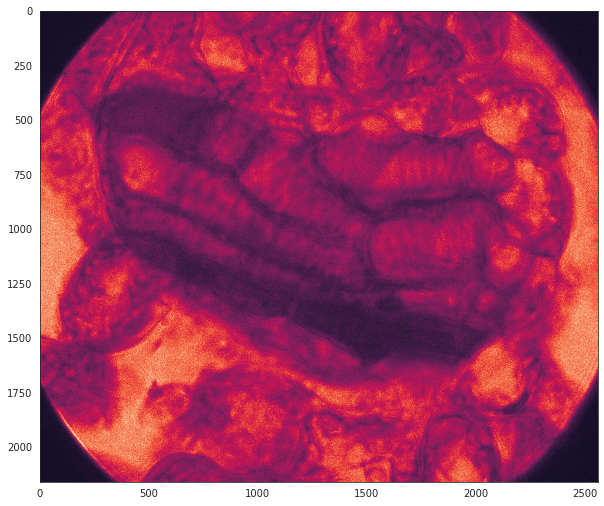

/root/projects/HPA/data/mic_photos/10_10xBrightfield.tif


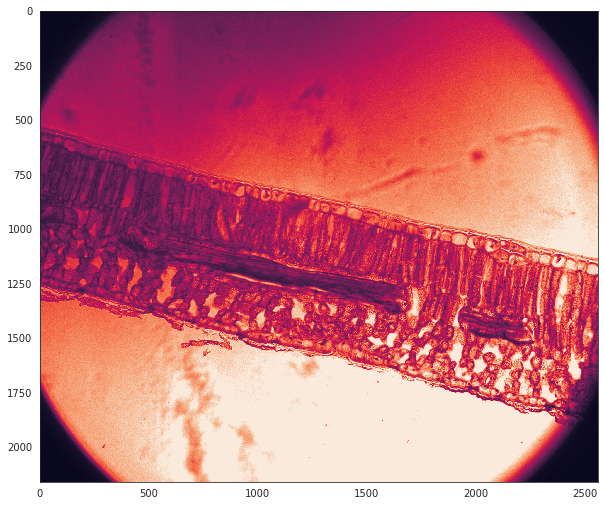

/root/projects/HPA/data/mic_photos/40_10xBrightfield1.tif


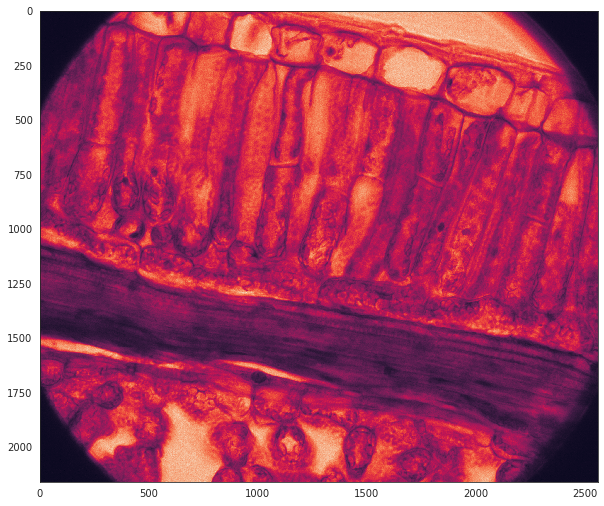

/root/projects/HPA/data/mic_photos/40_10xBrightfield2.tif


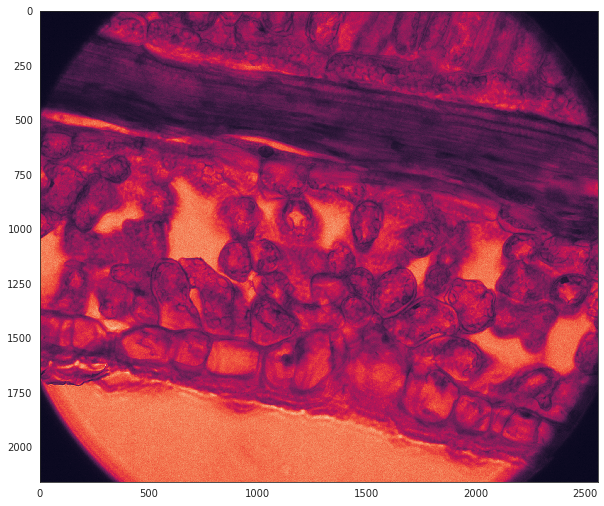

/root/projects/HPA/data/mic_photos/100_10xBrightfieldMIDDLE.tif


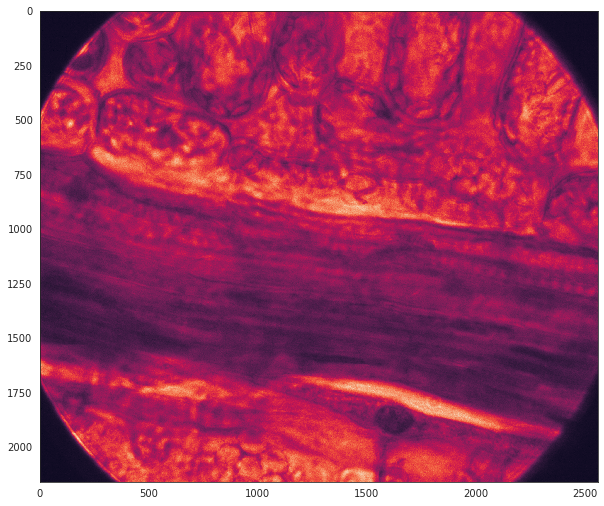

/root/projects/HPA/data/mic_photos/10_10xFitc.tif


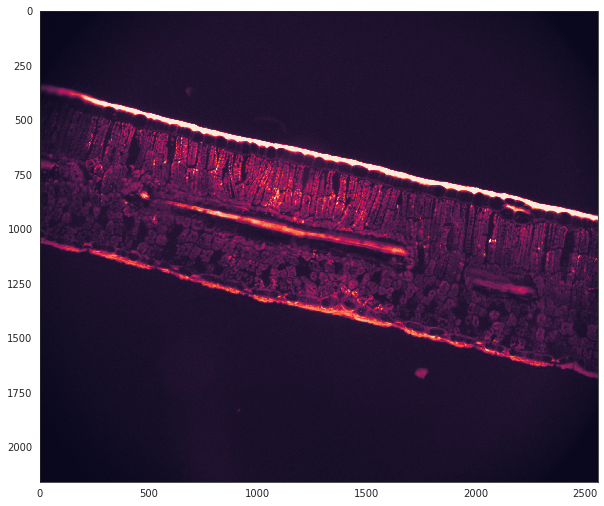

/root/projects/HPA/data/mic_photos/20_10xBrightfield.tif


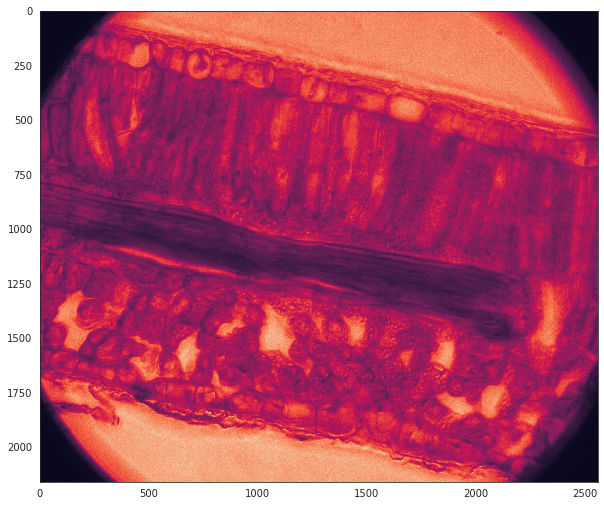

/root/projects/HPA/data/mic_photos/100_10xBrightfield3.tif


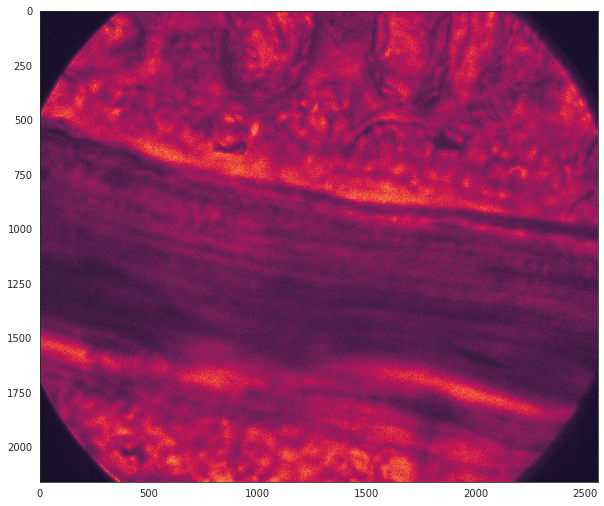

/root/projects/HPA/data/mic_photos/100_10xBrightfield2.tif


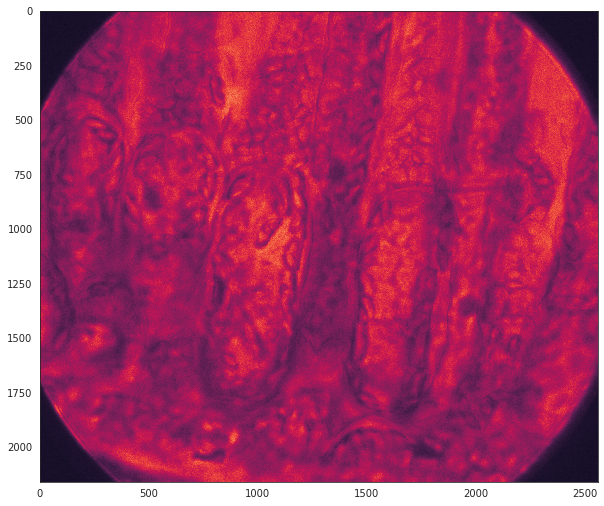

/root/projects/HPA/data/mic_photos/100_10xBrightfield1.tif


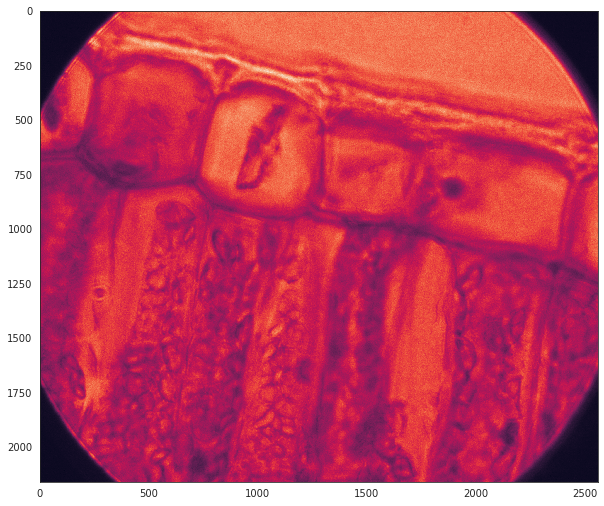

/root/projects/HPA/data/mic_photos/100_10xBrightfield4.tif


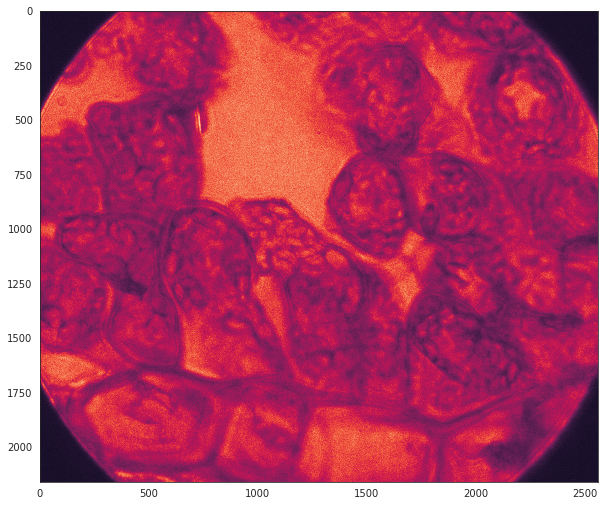

/root/projects/HPA/data/mic_photos/10_10xTxRed.tif


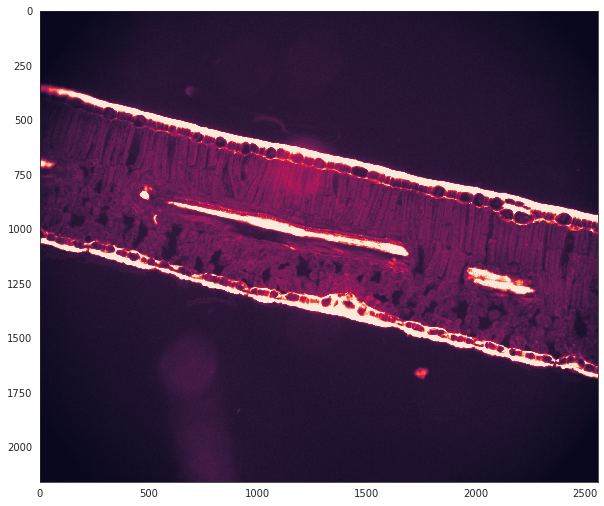

/root/projects/HPA/data/mic_photos/10_10xCy5.tif


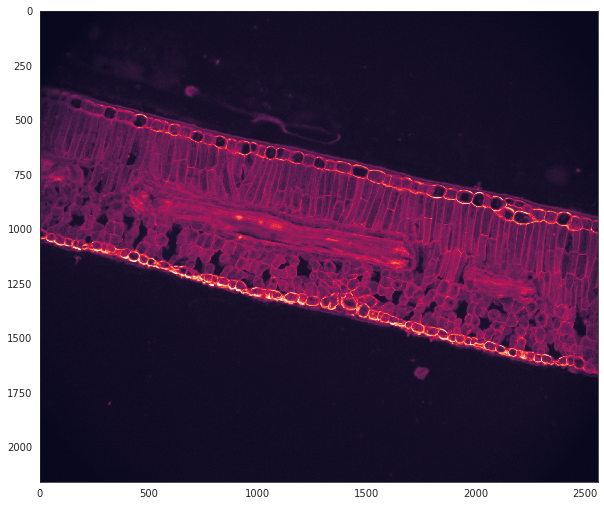

/root/projects/HPA/data/mic_photos/40_10xCy5_1.tif


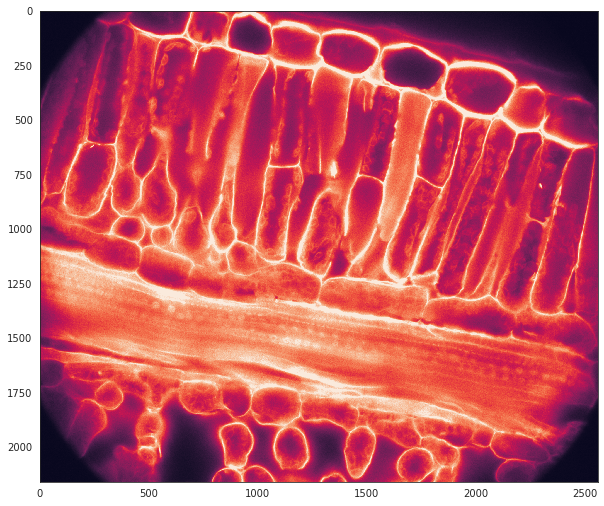

In [10]:
for p in paths:
    print(p)
    plt.figure(figsize=(10,10))
    plt.imshow(cv2.imread(p, -1))
    plt.show()

In [11]:
import torch
from torch.autograd import Variable
from PIL import Image
from torchvision.transforms import Resize, ToTensor
from src.modules.srgan.model import Generator

scale_factor = 2
netG = Generator(scale_factor)
netG.load_state_dict(torch.load('../srgan_training/hpa/epochs/netG_epoch_2_6.pth'))

if torch.cuda.is_available():
    netG.cuda()

sample_img_path = '/root/projects/HPA/data/mic_photos/40_10xCy5_1.tif'
sample_img = Image.fromarray(cv2.imread(sample_img_path, -1).astype(np.float))
w, h = sample_img.size

lr_scale = Resize(w // scale_factor, interpolation=Image.BICUBIC)
hr_scale = Resize(w, interpolation=Image.BICUBIC)
sample_img_lr = lr_scale(sample_img)
sample_img_restore = hr_scale(sample_img_lr)


silr = np.array(sample_img_lr)
sample_img_lr = (10 * (silr / 2**16)).astype(np.float32)
#sample_img_lr = np.array(sample_img_lr).astype(np.float32)

sample_img_input = Variable(ToTensor()(sample_img_lr))
if torch.cuda.is_available():
    sample_img_input = sample_img_input.cuda()
    
sample_img_input = sample_img_input.unsqueeze(0)
sample_img_result = netG(sample_img_input).data.cpu().squeeze()

imgs = [sample_img, sample_img_lr, sample_img_restore, sample_img_result]

for img in imgs:
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.show()

RuntimeError: CUDA out of memory. Tried to allocate 476.00 MiB (GPU 0; 10.73 GiB total capacity; 9.74 GiB already allocated; 140.69 MiB free; 47.68 MiB cached)

In [7]:
glob('/root/projects/HPA/data/mic_photos/*')

['/root/projects/HPA/data/mic_photos/100_10xBrightfieldCoolStuff.tif',
 '/root/projects/HPA/data/mic_photos/10_10xBrightfield.tif',
 '/root/projects/HPA/data/mic_photos/40_10xBrightfield1.tif',
 '/root/projects/HPA/data/mic_photos/40_10xBrightfield2.tif',
 '/root/projects/HPA/data/mic_photos/100_10xBrightfieldMIDDLE.tif',
 '/root/projects/HPA/data/mic_photos/10_10xFitc.tif',
 '/root/projects/HPA/data/mic_photos/20_10xBrightfield.tif',
 '/root/projects/HPA/data/mic_photos/100_10xBrightfield3.tif',
 '/root/projects/HPA/data/mic_photos/100_10xBrightfield2.tif',
 '/root/projects/HPA/data/mic_photos/100_10xBrightfield1.tif',
 '/root/projects/HPA/data/mic_photos/100_10xBrightfield4.tif',
 '/root/projects/HPA/data/mic_photos/10_10xTxRed.tif',
 '/root/projects/HPA/data/mic_photos/10_10xCy5.tif',
 '/root/projects/HPA/data/mic_photos/40_10xCy5_1.tif']

In [8]:
img_path = '/root/projects/HPA/data/mic_photos/40_10xCy5_1.tif'
img_40x10 = Image.fromarray(cv2.imread(img_path, -1).astype(np.float))
img_path = '/root/projects/HPA/data/mic_photos/10_10xCy5.tif'
img_10x10 = Image.fromarray(cv2.imread(img_path, -1).astype(np.float))

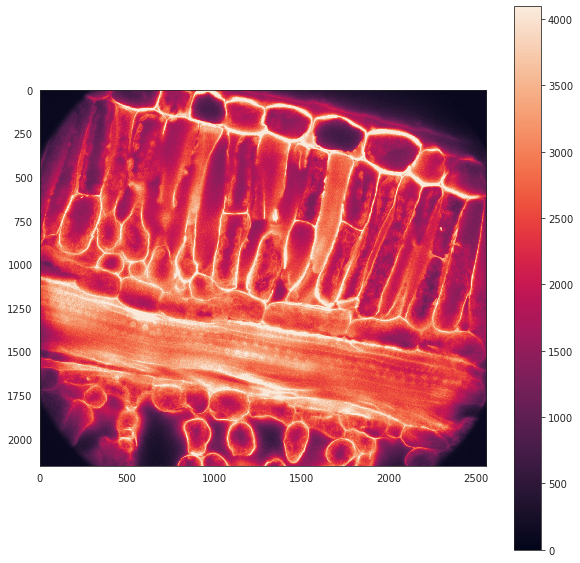

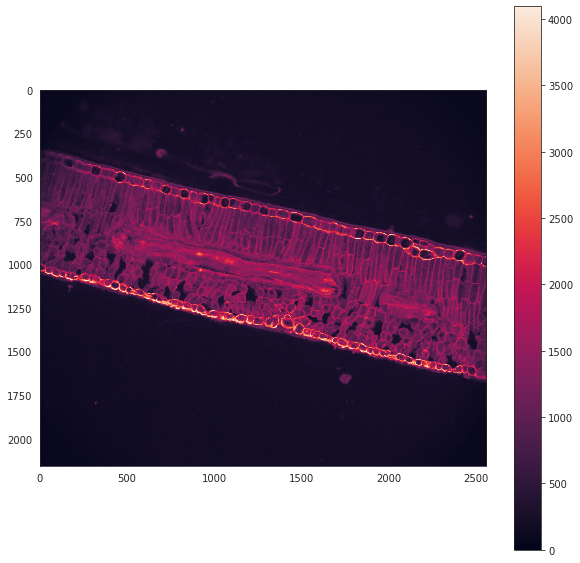

In [10]:
for img in [img_40x10, img_10x10]:
    plt.figure(figsize=(10,10))
    a = plt.imshow(img)
    plt.colorbar(a)
    plt.show()

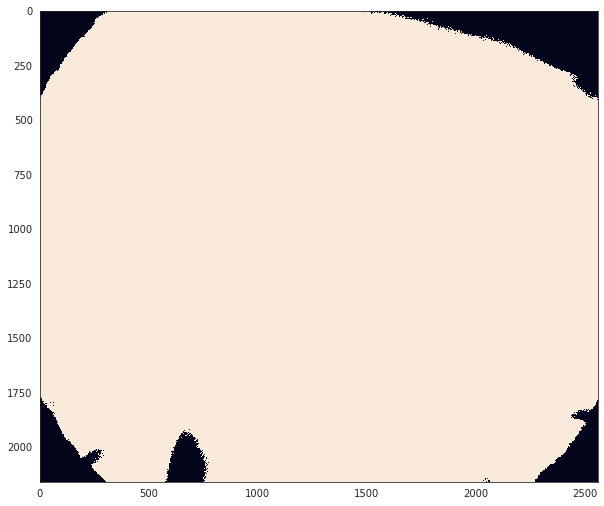

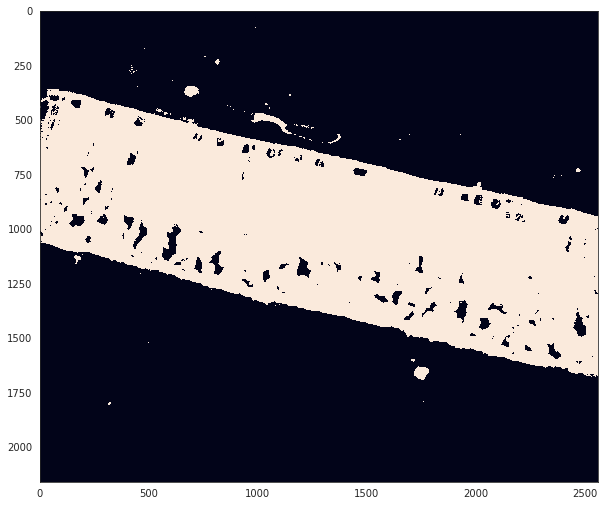

In [25]:
for img in [img_40x10, img_10x10]:
    plt.figure(figsize=(10,10))
    plt.imshow((np.array(img) > 500) + scipy.ndimage.binary_erosion(np.array(img) > 500, iterations=10))
    plt.show()

In [14]:
img_40x10, img_10x10 = np.array(img_40x10), np.array(img_10x10)

In [20]:
shape = np.array(img_40x10.shape) // 4
img_40x10_os = cv2.resize(img_40x10, tuple(shape[::-1].tolist()))

In [21]:
img_40x10.shape

(2160, 2560)

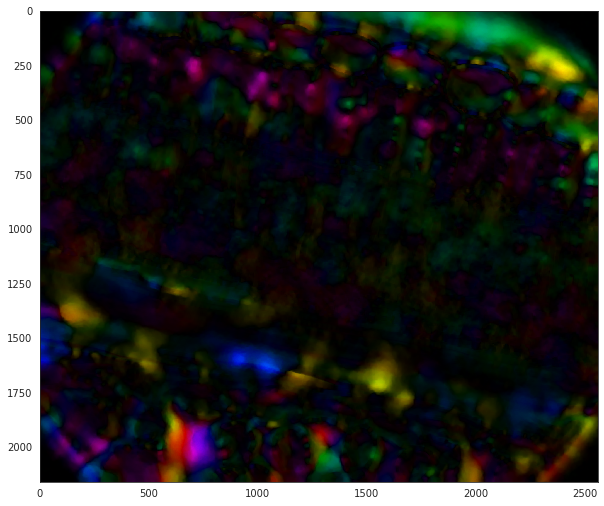

In [17]:
import cv2
import numpy as np


hsv = np.ones(shape=(*img_10x10.shape, 3), dtype=np.uint8) * 255

flow = cv2.calcOpticalFlowFarneback(img_40x10, img_10x10, None, 0.5, 3, 15, 3, 5, 1.2, 0)

mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
hsv[...,0] = ang*180/np.pi/2
hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)


plt.figure(figsize=(10,10))
plt.imshow(rgb)
plt.show()